# Measure cplex performances

In [1]:
import sys
sys.path.append('..')

from src import cplex
import numpy as np
from time import time
from timeit import timeit, repeat
import tracemalloc
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm, trange

In [2]:
problem_sizes = np.arange(4, 100, 2)
problem_Cs = 2*problem_sizes

problems_weights = [np.random.randint(1, C-1, size=n, ) for n, C in zip(problem_sizes, problem_Cs)]
problems_values = [np.random.randint(1, C+1, size=n) for n, C in zip(problem_sizes, problem_Cs)]

In [3]:
times = []
stds = []
memory = []
repeats = 10

for i in trange(problem_sizes.shape[0]):
    
    tracemalloc.start()
    time = repeat(lambda: cplex.cplex_kp_solver(problems_values[i], problems_weights[i], problem_Cs[i], problem_sizes[i]), repeat=repeats, number=repeats)
    #cplex.cplex_kp_solver(problems_values[i], problems_weights[i], problem_Cs[i], problem_sizes[i])
    times.append(np.array(time).mean())
    stds.append(np.array(time).std())
    memory.append(tracemalloc.get_traced_memory()[0])
    tracemalloc.stop()

  0%|          | 0/48 [00:00<?, ?it/s]

Knapsack problem instance as a BLIP
Problem name: KP_0004_00008

Maximize
  3*x_0 + 2*x_1 + 7*x_2 + x_3

Subject to
  Linear constraints (1)
    4*x_0 + x_1 + x_2 + 3*x_3
    <= 8  'The total weight of the knapsack must not exceed 8'

  Binary variables (4)
    x_0 x_1 x_2 x_3




Knapsack problem instance as a BLIP
Problem name: KP_0004_00008

Maximize
  3*x_0 + 2*x_1 + 7*x_2 + x_3

Subject to
  Linear constraints (1)
    4*x_0 + x_1 + x_2 + 3*x_3
    <= 8  'The total weight of the knapsack must not exceed 8'

  Binary variables (4)
    x_0 x_1 x_2 x_3






Knapsack problem instance as a BLIP
Problem name: KP_0004_00008

Maximize
  3*x_0 + 2*x_1 + 7*x_2 + x_3

Subject to
  Linear constraints (1)
    4*x_0 + x_1 + x_2 + 3*x_3
    <= 8  'The total weight of the knapsack must not exceed 8'

  Binary variables (4)
    x_0 x_1 x_2 x_3




Knapsack problem instance as a BLIP
Problem name: KP_0004_00008

Maximize
  3*x_0 + 2*x_1 + 7*x_2 + x_3

Subject to
  Linear constraints (1)
    4*x_0 + x_1 + x_2 + 3*x_3
    <= 8  'The total weight of the knapsack must not exceed 8'

  Binary variables (4)
    x_0 x_1 x_2 x_3




Knapsack problem instance as a BLIP
Problem name: KP_0004_00008

Maximize
  3*x_0 + 2*x_1 + 7*x_2 + x_3

Subject to
  Linear constraints (1)
    4*x_0 + x_1 + x_2 + 3*x_3
    <= 8  'The total weight of the knapsack must not exceed 8'

  Binary variables (4)
    x_0 x_1 x_2 x_3




Knapsack problem instance as a BLIP
Problem name: KP_0004_00008

Maximize
  3*x_0 + 2*x_1 + 7*x_2 + x_3

Subject to
  Linear constraints (1)
    4*x_0 + x

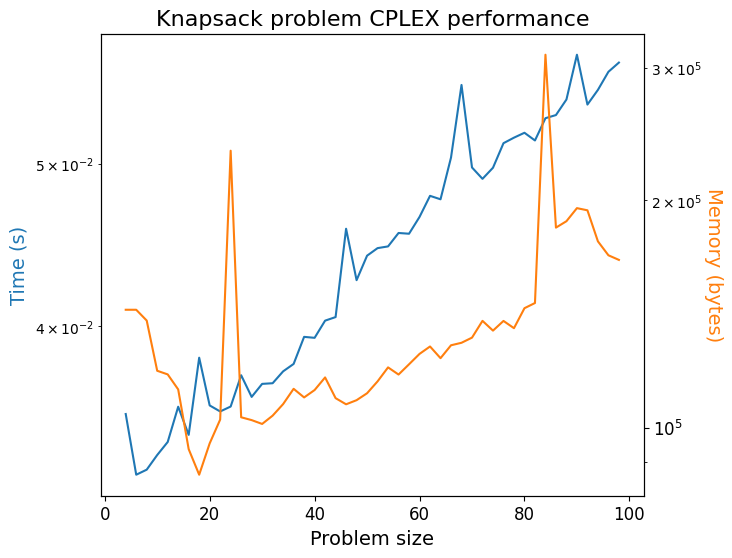

In [6]:
FONTSIZE = 14

fig, ax = plt.subplots(1, 1, figsize=(7, 6))

ax.plot(problem_sizes, np.array(times)/repeats)
#ax.set_xticks(problem_sizes)
ax.tick_params(axis='both', which='major', labelsize=FONTSIZE-2)
ax.set_yscale('log')
ax.set_xlabel('Problem size', fontsize=FONTSIZE)
ax.set_ylabel('Time (s)', color='tab:blue', fontsize=FONTSIZE)
ax.set_title('Knapsack problem CPLEX performance', fontsize=FONTSIZE+2)
ax2 = ax.twinx()
ax2.plot(problem_sizes, memory, color='tab:orange')
ax2.tick_params(axis='y', which='major', labelsize=FONTSIZE-2)
ax2.set_yscale('log')
ax2.set_ylabel('Memory (bytes)', color='tab:orange', fontsize=FONTSIZE, rotation=270, labelpad=15)
plt.show()

In [5]:
memory[0] = memory[1]

In [8]:
fig.savefig('cplex_performance2.svg')

In [7]:
np.save('cplex_performance.npy', np.array([problem_sizes, times, stds, memory]))